In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import functools
import os
import time
import IPython.display as display
import PIL.Image
from matplotlib import gridspec
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import cv2
print("TF Version: ", tf.__version__)
print("TF-Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.test.is_gpu_available())

TF Version:  2.4.1
TF-Hub version:  0.12.0
Eager mode enabled:  True
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU available:  True


In [ ]:
def crop_center(image):
  """Returns a cropped square image."""
  shape = image.shape
  new_shape = min(shape[1], shape[2])
  offset_y = max(shape[1] - shape[2], 0) // 2
  offset_x = max(shape[2] - shape[1], 0) // 2
  image = tf.image.crop_to_bounding_box(
      image, offset_y, offset_x, new_shape, new_shape)
  return image

#@functools.lru_cache(maxsize=None)
def load_image(image_url, image_size=(256, 256), preserve_aspect_ratio=True):
  """Loads and preprocesses images."""
  # Cache image file locally.
  if image_url[:4] =='http':
      image_path = tf.keras.utils.get_file(os.path.basename(image_url)[-128:], image_url)
      # Load and convert to float32 numpy array, add batch dimension, and normalize to range [0, 1].
      img = plt.imread(image_path).astype(np.float32)[np.newaxis, ...]
  else:
      img = plt.imread(image_url).astype(np.float32)[np.newaxis, ...]

  if img.max() > 1.0:
    img = img / 255.
  if len(img.shape) == 3:
    img = tf.stack([img, img, img], axis=-1)
  img = crop_center(img)
  img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)
  return img

def show_n(images, titles=('',)):
  n = len(images)
  image_sizes = [image.shape[1] for image in images]
  w = (image_sizes[0] * 6) // 320
  plt.figure(figsize=(w  * n, w))
  gs = gridspec.GridSpec(1, n, width_ratios=image_sizes)
  for i in range(n):
    plt.subplot(gs[i])
    plt.imshow(images[i][0], aspect='equal')
    plt.axis('off')
    plt.title(titles[i] if len(titles) > i else '')
  plt.show()

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)



> import celeba data



In [ ]:
import zipfile
celeba_img = zipfile.ZipFile('/content/drive/Shareddrives/cs 585 final project/Img/img_align_celeba.zip')

In [ ]:
# extract data from zip file, first 150 files
for i in range(152,302):
    celeba_img.extract(celeba_img.namelist()[i])

In [ ]:
# read celeba image
content_image_list = []
for i in range(152,302):
    if i < 10:
        image = cv2.imread('/content/img_align_celeba/00000'+str(i)+'.jpg', cv2.IMREAD_COLOR)
    elif i<100:
        image = cv2.imread('/content/img_align_celeba/0000'+str(i)+'.jpg', cv2.IMREAD_COLOR)
    else:
        image = cv2.imread('/content/img_align_celeba/000'+str(i)+'.jpg', cv2.IMREAD_COLOR)
    content_image_list.append(image)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


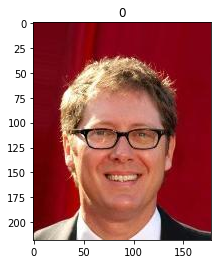

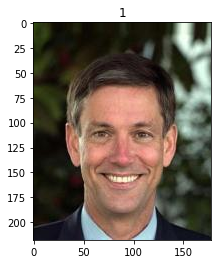

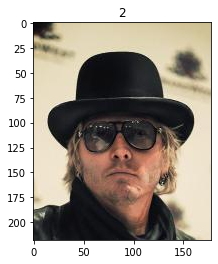

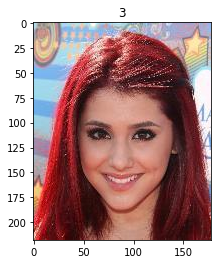

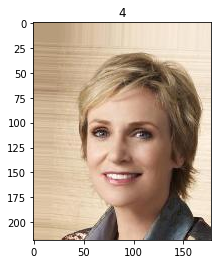

...

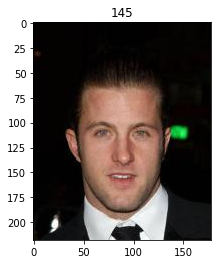

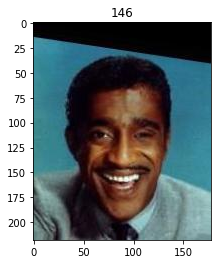

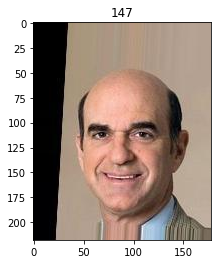

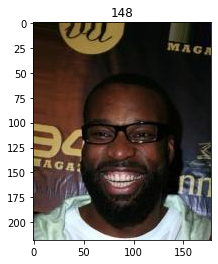

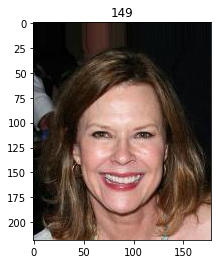

<Figure size 432x288 with 0 Axes>

In [ ]:
for i in range(150):
    plt.imshow(content_image_list[i][:,:,::-1])
    plt.title(str(i))
    plt.figure()



> import paintings data



In [ ]:
import pandas as pd
data = pd.read_excel('/content/drive/Shareddrives/cs 585 final project/painting_dataset_2018.xlsx')
data = data.values

212992/208698 [==============================] - 0s 0us/step


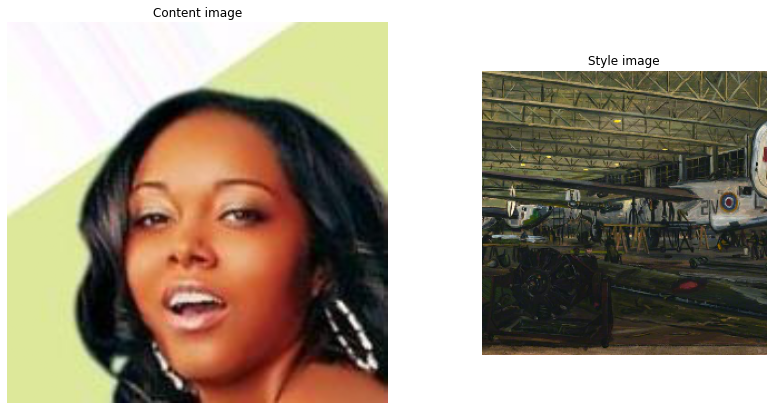

In [ ]:
import urllib
import requests
import re
import numpy as np
from io import BytesIO
import cv2
import matplotlib.pyplot as plt
# The content image size can be arbitrary.
output_image_size = 384
content_img_size = (output_image_size, output_image_size)

# The style prediction model was trained with image size 256 and it's the 
# recommended image size for the style image (though, other sizes work as 
# well but will lead to different results).
style_img_size = (256, 256)  # Recommended to keep it at 256.
style_image_list = []
for i in range(1,150):
    content = requests.get(data[i][1])
    find_img = re.compile('<img src="(.*?)"')
    img = re.findall(find_img,content.text)[0]
    style_image_url = img
    style_image = load_image(style_image_url, style_img_size)
    style_image_list.append(style_image)

content_image_list = []
for i in range(152,302):
    if i < 10:
        image = load_image('/content/img_align_celeba/00000'+str(i)+'.jpg', content_img_size)
    elif i<100:
        image = load_image('/content/img_align_celeba/0000'+str(i)+'.jpg', content_img_size)
    else:
        image = load_image('/content/img_align_celeba/000'+str(i)+'.jpg', content_img_size)
    content_image_list.append(image)

style_image = tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME')
show_n([content_image_list[10], style_image_list[10]], ['Content image', 'Style image'])

In [ ]:
# Load TF-Hub module.
hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)

In [ ]:
# Stylize content image with given style image.
# This is pretty fast within a few milliseconds on a GPU.
from google.colab import files
from PIL import Image
import os, tarfile
stylized_image_list = []
tar = tarfile.open("style.tar","w")
for i in range(149): 
    outputs = hub_module(tf.constant(content_image_list[i]), tf.constant(style_image_list[i]))
    stylized_image = outputs[0]
    stylized_image_list.append(stylized_image)
    # Visualize input images and the generated stylized image.
    print('id:',i)
    #show_n([content_image_list[i], style_image_list[i], stylized_image], titles=['Original content image', 'Style image', 'Stylized image'])
    #print(type(stylized_image))
    #tf.keras.preprocessing.image.save_img('image{0}.png'.format(i),stylized_image[0])
    tf.keras.preprocessing.image.save_img('style{0}.png'.format(i),style_image_list[i][0])
    #image = Image.fromarray(stylized_image)
    #image.save('image{0}'.format(i), format='PNG')
    #plt.savefig(Image.fromarray(np.uint8(stylized_image)))
    tar.add('style{0}.png'.format(i))
    #files.download('image{0}.png'.format(i))
    

tar.close()
files.download("style.tar")

id: 0
id: 1
id: 2
id: 3
id: 4
id: 5
id: 6
id: 7
id: 8
id: 9
id: 10
id: 11
id: 12
id: 13
id: 14
id: 15
id: 16
id: 17
id: 18
id: 19
id: 20
id: 21
id: 22
id: 23
id: 24
id: 25
id: 26
id: 27
id: 28
id: 29
id: 30
id: 31
id: 32
id: 33
id: 34
id: 35
id: 36
id: 37
id: 38
id: 39
id: 40
id: 41
id: 42
id: 43
id: 44
id: 45
id: 46
id: 47
id: 48
id: 49
id: 50
id: 51
id: 52
id: 53
id: 54
id: 55
id: 56
id: 57
id: 58
id: 59
id: 60
id: 61
id: 62
id: 63
id: 64
id: 65
id: 66
id: 67
id: 68
id: 69
id: 70
id: 71
id: 72
id: 73
id: 74
id: 75
id: 76
id: 77
id: 78
id: 79
id: 80
id: 81
id: 82
id: 83
id: 84
id: 85
id: 86
id: 87
id: 88
id: 89
id: 90
id: 91
id: 92
id: 93
id: 94
id: 95
id: 96
id: 97
id: 98
id: 99
id: 100
id: 101
id: 102
id: 103
id: 104
id: 105
id: 106
id: 107
id: 108
id: 109
id: 110
id: 111
id: 112
id: 113
id: 114
id: 115
id: 116
id: 117
id: 118
id: 119
id: 120
id: 121
id: 122
id: 123
id: 124
id: 125
id: 126
id: 127
id: 128
id: 129
id: 130
id: 131
id: 132
id: 133
id: 134
id: 135
id: 136
id: 137
id: 13

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>



# > **color distribution on Y-axis**



In [ ]:
# fix sytle image, change content image
special = [1,5,6,8,24,26]
normal = [21,46]
special_curve = []
normal_curve = []
for i in range(149):
    outputs = hub_module(tf.constant(content_image_list[i]), tf.constant(style_image_list[special[0]]))
    stylized_image = outputs[0]
    #special_curve.append(tf.image.total_variation(stylized_image).numpy()-tf.image.total_variation(content_image_list[i]).numpy())
    special_curve.append(np.sum(np.mean(np.squeeze(stylized_image.numpy()),axis = 1),axis=1))
    outputs = hub_module(tf.constant(content_image_list[i]), tf.constant(style_image_list[normal[0]]))
    stylized_image = outputs[0]
    #normal_curve.append(tf.image.total_variation(stylized_image).numpy()-tf.image.total_variation(content_image_list[i]).numpy())
    normal_curve.append(np.sum(np.mean(np.squeeze(stylized_image.numpy()),axis = 1),axis=1))
#print(tf.image.total_variation(content_image_list[i]).numpy(),tf.image.total_variation(stylized_image).numpy())

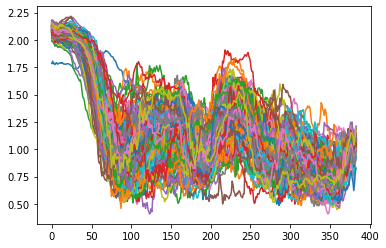

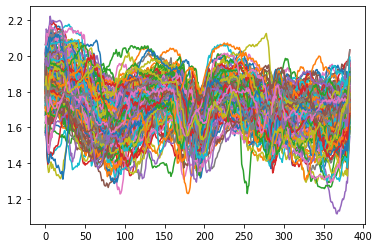

In [ ]:
for i in range(149):
    plt.plot(special_curve[i])
plt.figure()
for i in range(149):
    plt.plot(normal_curve[i])


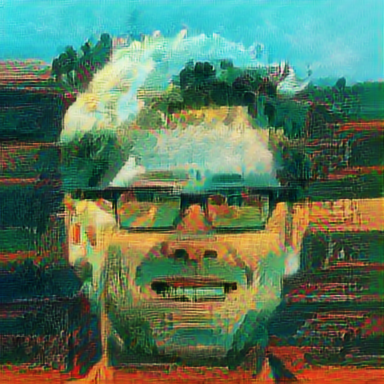

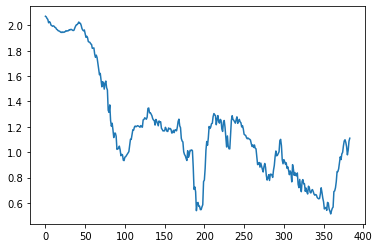

In [ ]:
plt.plot(special_curve[0])
outputs = hub_module(tf.constant(content_image_list[0]), tf.constant(style_image_list[special[0]]))
stylized_image = outputs[0]
tensor_to_image(stylized_image)

In [ ]:
#compute total variation loss
# fix content image , change style image
special = [43,36]
normal = [34]
special_curve = []
normal_curve = []
for i in range(149):
    outputs = hub_module(tf.constant(content_image_list[special[0]]), tf.constant(style_image_list[i]))
    stylized_image = outputs[0]
    special_curve.append(tf.image.total_variation(stylized_image).numpy()-tf.image.total_variation(content_image_list[special[0]]).numpy())

    outputs = hub_module(tf.constant(content_image_list[normal[0]]), tf.constant(style_image_list[i]))
    stylized_image = outputs[0]
    normal_curve.append(tf.image.total_variation(stylized_image).numpy()-tf.image.total_variation(content_image_list[normal[0]]).numpy())

#print(tf.image.total_variation(content_image_list[i]).numpy(),tf.image.total_variation(stylized_image).numpy())

In [ ]:
plt.plot(special_curve)

In [ ]:
tensor_to_image(style_image_list[normal[0]])



# > **Content loss**
> I want to sperate horizontal and vertical sum of edges using edge detection. and compare it between style image and original image.





> vertical sum of edge



In [ ]:
def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]
  return x_var, y_var

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

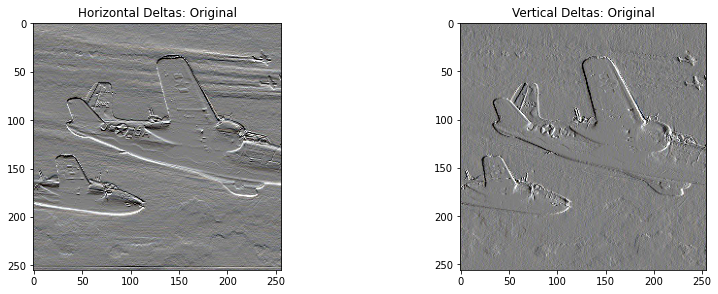

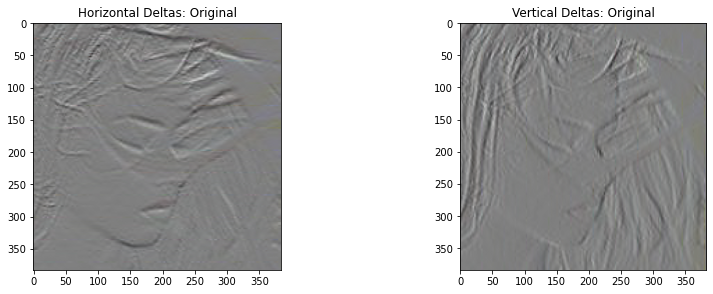

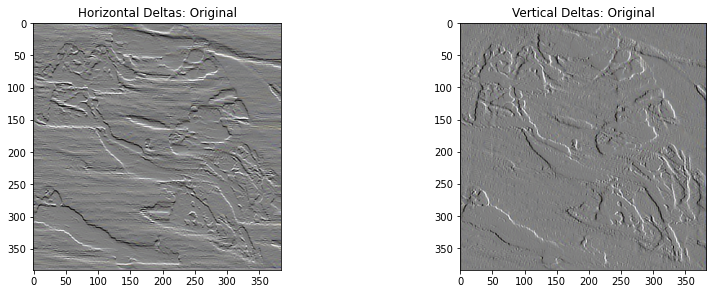

In [ ]:
x_deltas1,y_deltas1 = high_pass_x_y(style_image_list[15])
plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
imshow(clip_0_1(2*y_deltas1+0.5), "Horizontal Deltas: Original")

plt.subplot(2, 2, 2)
imshow(clip_0_1(2*x_deltas1+0.5), "Vertical Deltas: Original")

x_deltas2,y_deltas2 = high_pass_x_y(content_image_list[15])
plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
imshow(clip_0_1(2*y_deltas2+0.5), "Horizontal Deltas: Original")

plt.subplot(2, 2, 2)
imshow(clip_0_1(2*x_deltas2+0.5), "Vertical Deltas: Original")

x_deltas3,y_deltas3 = high_pass_x_y(stylized_image_list[15])
plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
imshow(clip_0_1(2*y_deltas3+0.5), "Horizontal Deltas: Original")

plt.subplot(2, 2, 2)
imshow(clip_0_1(2*x_deltas3+0.5), "Vertical Deltas: Original")

In [ ]:
print('original style horizontal loss: {}'.format(tf.reduce_sum(tf.abs(y_deltas1))),', original style vertical loss: {}'.format(tf.reduce_sum(tf.abs(x_deltas1))),'\n')
print('original content horizontal loss: {}'.format(tf.reduce_sum(tf.abs(y_deltas2))),', original content vertical loss: {}'.format(tf.reduce_sum(tf.abs(x_deltas2))),'\n')
print('stylized horizontal loss: {}'.format(tf.reduce_sum(tf.abs(y_deltas3))),', stylized vertical loss: {}'.format(tf.reduce_sum(tf.abs(x_deltas3))),'\n')

original style horizontal loss: 6850.52294921875 , original style vertical loss: 4937.7373046875 

original content horizontal loss: 5303.34130859375 , original content vertical loss: 6245.794921875 

stylized horizontal loss: 15635.6943359375 , stylized vertical loss: 10453.515625 



In [ ]:
special = [15,132]
normal = [48]
content_horizontal_curve = []
content_vertical_curve = []
special_stylized_horizontal_curve = []
special_stylized_vertical_curve = []
special_stylized_horizontal_curve2 = []
special_stylized_vertical_curve2 = []
normal_stylized_horizontal_curve = []
normal_stylized_vertical_curve = []

for i in range(149):
    outputs = hub_module(tf.constant(content_image_list[i]), tf.constant(style_image_list[special[0]]))
    stylized_image = outputs[0]
    x_deltas1,y_deltas1 = high_pass_x_y(content_image_list[i])
    x_deltas2,y_deltas2 = high_pass_x_y(stylized_image)
    #special_curve.append(tf.image.total_variation(stylized_image).numpy()-tf.image.total_variation(content_image_list[i]).numpy())
    content_horizontal_curve.append(tf.reduce_sum(tf.abs(y_deltas1)).numpy())
    content_vertical_curve.append(tf.reduce_sum(tf.abs(x_deltas1)).numpy())
    special_stylized_horizontal_curve.append(tf.reduce_sum(tf.abs(y_deltas2)).numpy())
    special_stylized_vertical_curve.append(tf.reduce_sum(tf.abs(x_deltas2)).numpy())

    outputs = hub_module(tf.constant(content_image_list[i]), tf.constant(style_image_list[special[1]]))
    stylized_image = outputs[0]
    x_deltas2,y_deltas2 = high_pass_x_y(stylized_image)
    #special_curve.append(tf.image.total_variation(stylized_image).numpy()-tf.image.total_variation(content_image_list[i]).numpy())
    special_stylized_horizontal_curve2.append(tf.reduce_sum(tf.abs(y_deltas2)).numpy())
    special_stylized_vertical_curve2.append(tf.reduce_sum(tf.abs(x_deltas2)).numpy())

    special_curve.append(np.sum(np.mean(np.squeeze(stylized_image.numpy()),axis = 1),axis=1))
    outputs = hub_module(tf.constant(content_image_list[i]), tf.constant(style_image_list[normal[0]]))
    stylized_image = outputs[0]
    x_deltas3,y_deltas3 = high_pass_x_y(stylized_image)
    normal_stylized_horizontal_curve.append(tf.reduce_sum(tf.abs(y_deltas3)).numpy())
    normal_stylized_vertical_curve.append(tf.reduce_sum(tf.abs(x_deltas3)).numpy())

In [ ]:
x_deltas1,y_deltas1 = high_pass_x_y(style_image_list[special[0]])
print('original special style horizontal loss: {}'.format(tf.reduce_sum(tf.abs(y_deltas1))),', original special style vertical loss: {}'.format(tf.reduce_sum(tf.abs(x_deltas1))),'\n')

x_deltas1,y_deltas1 = high_pass_x_y(style_image_list[special[1]])
print('original special style horizontal loss: {}'.format(tf.reduce_sum(tf.abs(y_deltas1))),', original special style vertical loss: {}'.format(tf.reduce_sum(tf.abs(x_deltas1))),'\n')

x_deltas2,y_deltas2 = high_pass_x_y(style_image_list[normal[0]])
print('original special style horizontal loss: {}'.format(tf.reduce_sum(tf.abs(y_deltas2))),', original special style vertical loss: {}'.format(tf.reduce_sum(tf.abs(x_deltas2))),'\n')


original special style horizontal loss: 6850.52294921875 , original special style vertical loss: 4937.7373046875 

original special style horizontal loss: 4744.7109375 , original special style vertical loss: 3756.7744140625 

original special style horizontal loss: 9006.0947265625 , original special style vertical loss: 9261.330078125 



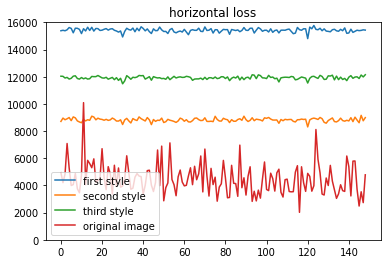

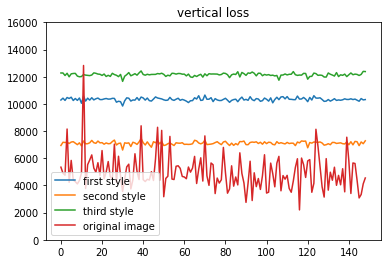

In [ ]:
plt.title('horizontal loss')
plt.plot(special_stylized_horizontal_curve,label='first style')
plt.plot(special_stylized_horizontal_curve2,label='second style')
plt.plot(normal_stylized_horizontal_curve,label='third style')
plt.plot(content_horizontal_curve,label='original image')
plt.ylim((0,16000))
plt.legend()
plt.figure()
plt.title('vertical loss')
plt.plot(special_stylized_vertical_curve,label='first style')
plt.plot(special_stylized_vertical_curve2,label='second style')
plt.plot(normal_stylized_vertical_curve,label='third style')
plt.plot(content_vertical_curve,label='original image')
plt.ylim((0,16000))
plt.legend()

In [ ]:
# examples show
special = [132]
normal = [48]
for i in range(6):
    outputs = hub_module(tf.constant(content_image_list[i]), tf.constant(style_image_list[special[0]]))
    stylized_image = outputs[0]
    show_n([content_image_list[i], style_image_list[special[0]], stylized_image], titles=['Original content image', 'Style image', 'Stylized image'])
for i in range(6):
    outputs = hub_module(tf.constant(content_image_list[i]), tf.constant(style_image_list[normal[0]]))
    stylized_image = outputs[0]
    show_n([content_image_list[i], style_image_list[normal[0]], stylized_image], titles=['Original content image', 'Style image', 'Stylized image'])    

Output hidden; open in https://colab.research.google.com to view.



# > **output style loss**



In [ ]:
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [ ]:
def vgg_layers(layer_names):
  """ Creates a vgg model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  
  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image_list[0]*255)

80142336/80134624 [==============================] - 0s 0us/step


In [ ]:
stylized_image_output = style_extractor(stylized_image*255)

In [ ]:

def style_loss(style,stylized):

    style_loss = tf.add_n([tf.reduce_mean((stylized[name]-style[name])**2) 
                           for name in stylized.keys()])
    style_loss /= num_style_layers
    '''
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    '''
    return style_loss

start = time.time()


In [ ]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}


In [ ]:
extractor = StyleContentModel(style_layers, content_layers)
style_loss_list = []
for i in range(49):
    style_targets = extractor(style_image_list[i])['style']
    stylized = extractor(stylized_image_list[i])['style']
    style_loss_list.append(style_loss(style_targets,stylized).numpy())

In [ ]:
style_loss_list

[2176701200.0,
 5655747000.0,
 1108574300.0,
 824199040.0,
 2711942000.0,
 4909905000.0,
 7809988000.0,
 10850008000.0,
 3517332700.0,
 1918676700.0,
 2113880800.0,
 10115104000.0,
 1004270700.0,
 1243961600.0,
 6236880400.0,
 1939655300.0,
 1729771300.0,
 1490185700.0,
 4732652000.0,
 831959040.0,
 583547300.0,
 647928960.0,
 997836100.0,
 481423200.0,
 976980300.0,
 1858280100.0,
 1832962800.0,
 827417340.0,
 349069120.0,
 2165058000.0,
 2663695400.0,
 2925146600.0,
 904673400.0,
 1826853500.0,
 730016060.0,
 495807070.0,
 1464369700.0,
 263229570.0,
 1814660700.0,
 1404031200.0,
 1614687400.0,
 1259515100.0,
 512923550.0,
 720179140.0,
 1148736800.0,
 1272474800.0,
 2544123000.0,
 2030277400.0,
 1756701400.0]